# Customer Churn Prediction with Machine Learning

## Background Context
Customer churn, also known as customer attrition, is when a customer stops doing business with a bank or switches to another bank. In this project, we will build the entire process of building customer churn prediction model. We will prepocess the dataset - load and clean the data to use for our model training. We will use 5 different ML models, perform hyperparameter tuning and serve the model for inference through a web app.

### Source: [Kaggle: Churn for Bank Customers](https://www.kaggle.com/datasets/mathchi/churn-for-bank-customers?select=churn.csv)

In [13]:
# Install packages individually
!pip install -U scikit-learn
!pip install -U matplotlib
!pip install seaborn
!pip install imblearn
!pip install kagglehub

In [ ]:
# !pip install -r requirements.txt

It is much more expensive to sign in a new client than

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
import kagglehub

# Download latest version
path = "https://media.githubusercontent.com/media/itancio/churn/refs/heads/main/streamlit/churn.csv"
churn_df = pd.read_csv(path)
churn_df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [17]:
churn_df.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,2886.89568,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [18]:
sns.set_style(style='whitegrid')
plt.figure(figsize=(12, 10))

<Figure size 1200x1000 with 0 Axes>

<Figure size 1200x1000 with 0 Axes>

<Axes: xlabel='Exited', ylabel='count'>

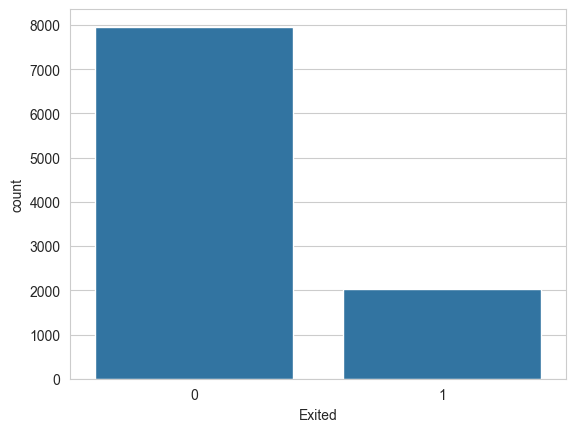

In [19]:
sns.countplot(x='Exited', data=churn_df)

Text(0.5, 1.0, 'Age Distribution')

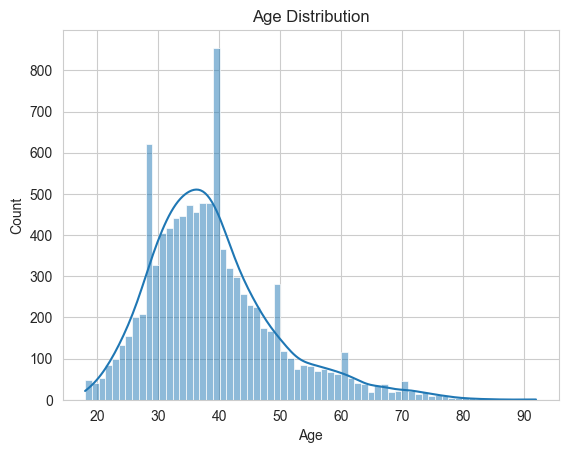

In [20]:
sns.histplot(data=churn_df, x ='Age', kde=True)
plt.title('Age Distribution')

As we see in the age distribution, we have two main groups: age 29 and age 41 that are dominate our sample.

Text(0.5, 1.0, 'Credit Score vs Age')

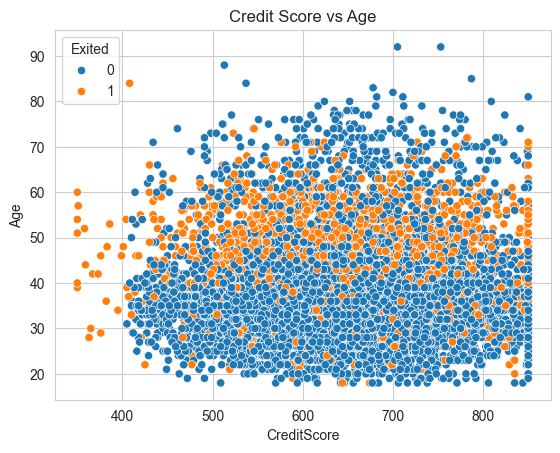

In [21]:
sns.scatterplot(data=churn_df, x='CreditScore', y='Age', hue='Exited')
plt.title('Credit Score vs Age')

In this plot, we see that the age group 40-60 years old are likely to churn

Text(0.5, 1.0, 'Balance Distribution by Churn')

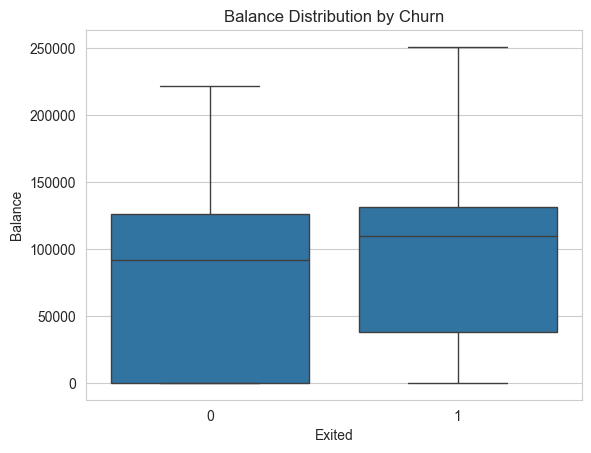

In [22]:
sns.boxplot(x='Exited', y='Balance', data=churn_df)
plt.title('Balance Distribution by Churn')

In this plot, we can see that people who who have account balances of $40,000+ tends to churn

Text(0.5, 1.0, 'Credit Score Distribution by Churn')

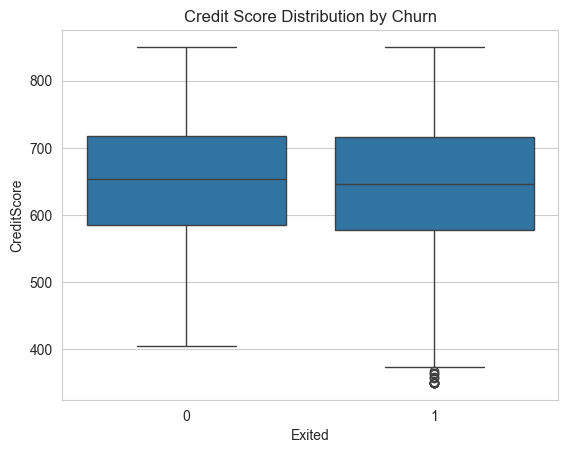

In [23]:
sns.boxplot(x='Exited', y='CreditScore', data=churn_df)
plt.title('Credit Score Distribution by Churn')

## Preprocessing the data
### 1. Separate feature and target variables
We need to separate the feature variables and the target variable. Features represent the different attributes of the customer, like their credit score, their balance, their age, their gender. And the target variable is a exited column which indicates whether the customer churned or not.

In [24]:
feature_variables = ['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary']
features = churn_df[feature_variables]

features

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,France,Female,42,2,0.00,1,1,1,101348.88
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,699,France,Female,39,1,0.00,2,0,0,93826.63
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10
...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77
9997,709,France,Female,36,7,0.00,1,0,1,42085.58
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52


In [25]:
target = churn_df['Exited']
target

0       1
1       0
2       1
3       0
4       0
       ..
9995    0
9996    0
9997    1
9998    1
9999    0
Name: Exited, Length: 10000, dtype: int64

### 2. Handle missing values

In [26]:
features = features.dropna()

### 3. Apply Categorical Encoding
Categorical Encoding expands categories in a feature by expanding the categories and encode 1 if they belong in that category or 0 if not.

In [121]:
encoded_features = pd.get_dummies(features, columns=['Geography', 'Gender'])
encoded_features

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,619,42,2,0.00,1,1,1,101348.88,True,False,False,True,False
1,608,41,1,83807.86,1,0,1,112542.58,False,False,True,True,False
2,502,42,8,159660.80,3,1,0,113931.57,True,False,False,True,False
3,699,39,1,0.00,2,0,0,93826.63,True,False,False,True,False
4,850,43,2,125510.82,1,1,1,79084.10,False,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,True,False,False,False,True
9996,516,35,10,57369.61,1,1,1,101699.77,True,False,False,False,True
9997,709,36,7,0.00,1,0,1,42085.58,True,False,False,True,False
9998,772,42,3,75075.31,2,1,0,92888.52,False,True,False,False,True


### 4. Split the dataset

In [28]:
from sklearn.model_selection import train_test_split

In [122]:
X_train, X_test, y_train, y_test = train_test_split(encoded_features, target, test_size=0.2, random_state=42)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
9254,686,32,6,0.00,2,1,1,179093.26,True,False,False,False,True
1561,632,42,4,119624.60,2,1,1,195978.86,False,True,False,False,True
1670,559,24,3,114739.92,1,1,0,85891.02,False,False,True,False,True
6087,561,27,9,135637.00,1,1,0,153080.40,True,False,False,True,False
6669,517,56,9,142147.32,1,0,0,39488.04,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,768,54,8,69712.74,1,1,1,69381.05,True,False,False,False,True
5191,682,58,1,0.00,1,1,1,706.50,True,False,False,True,False
5390,735,38,1,0.00,3,0,0,92220.12,True,False,False,True,False
860,667,43,8,190227.46,1,1,0,97508.04,True,False,False,False,True


In [123]:
print(f'Shape of X_train: {X_train.shape}')
print(X_train.size, X_test.size)

Shape of X_train: (8000, 13)
104000 26000


### 5. Scaling the dataset

In [31]:
from sklearn.preprocessing import StandardScaler

In [126]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

X_train.shape

[[ 0.35649971 -0.6557859   0.34567966 ... -0.57638802 -0.91324755
   0.91324755]
 [-0.20389777  0.29493847 -0.3483691  ... -0.57638802 -0.91324755
   0.91324755]
 [-0.96147213 -1.41636539 -0.69539349 ...  1.73494238 -0.91324755
   0.91324755]
 ...
 [ 0.86500853 -0.08535128 -1.38944225 ... -0.57638802  1.09499335
  -1.09499335]
 [ 0.15932282  0.3900109   1.03972843 ... -0.57638802 -0.91324755
   0.91324755]
 [ 0.47065475  1.15059039 -1.38944225 ... -0.57638802 -0.91324755
   0.91324755]]


(8000, 13)

## Training the model

In [34]:
from sklearn.linear_model import LogisticRegression

In [35]:
lr_model = LogisticRegression(random_state=42)

In [36]:
lr_model.fit(X_train, y_train)

LogisticRegression(random_state=42)

## Logistic Regression

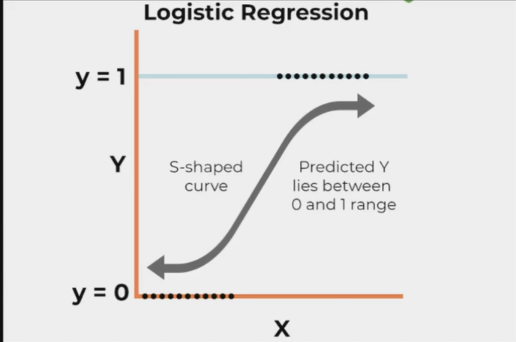

Logistic Regression is represented by a sigmoid function, an S-shaped curve that is useful in binary classification. In our case, we are trying to predict or classify customers who will churn or those who will not.

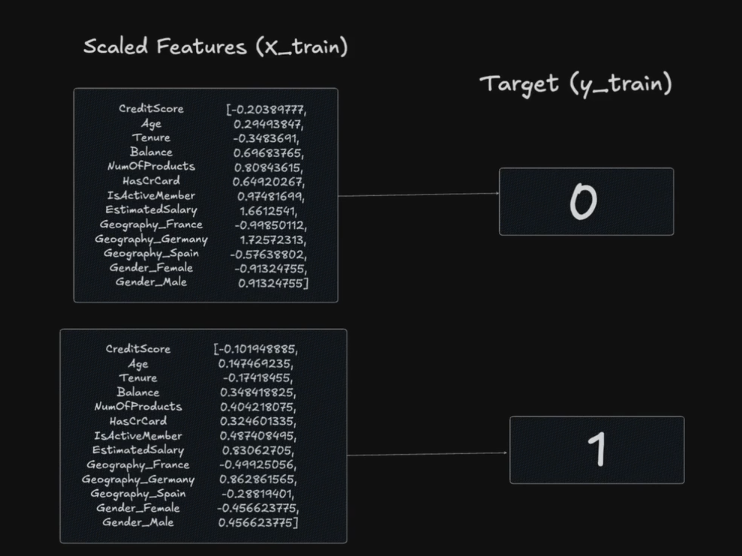

When we train our datasets with the model, the function iteratively perform logistic regression on each datasets. It iteratively tries to learn and updates the coefficients or weights of the model. Behind the scenes, the loss function for finding the most optimized weights is an updated gradient descent function.

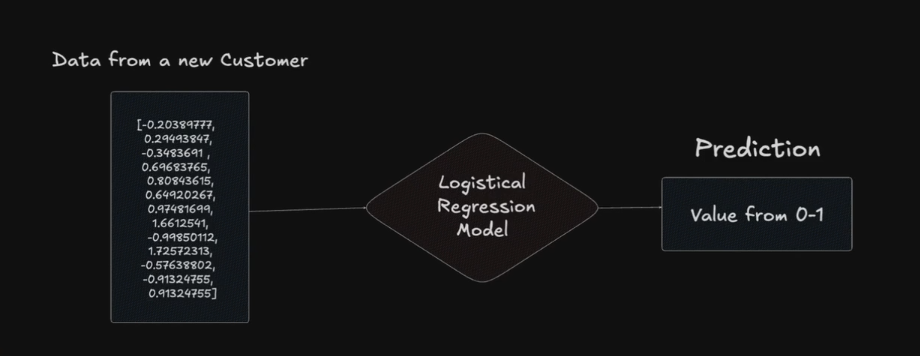

## Prediction

In [37]:
lr_predictions = lr_model.predict(X_test)
lr_predictions

array([0, 0, 0, ..., 0, 0, 0])

## Evaluation

In [128]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [129]:
lr_confusion_score = confusion_matrix(y_test, lr_predictions)
lr_confusion_score

array([[1541,   66],
       [ 312,   81]])

In [39]:
lr_accuracy = accuracy_score(y_test, lr_predictions)
lr_accuracy

0.811

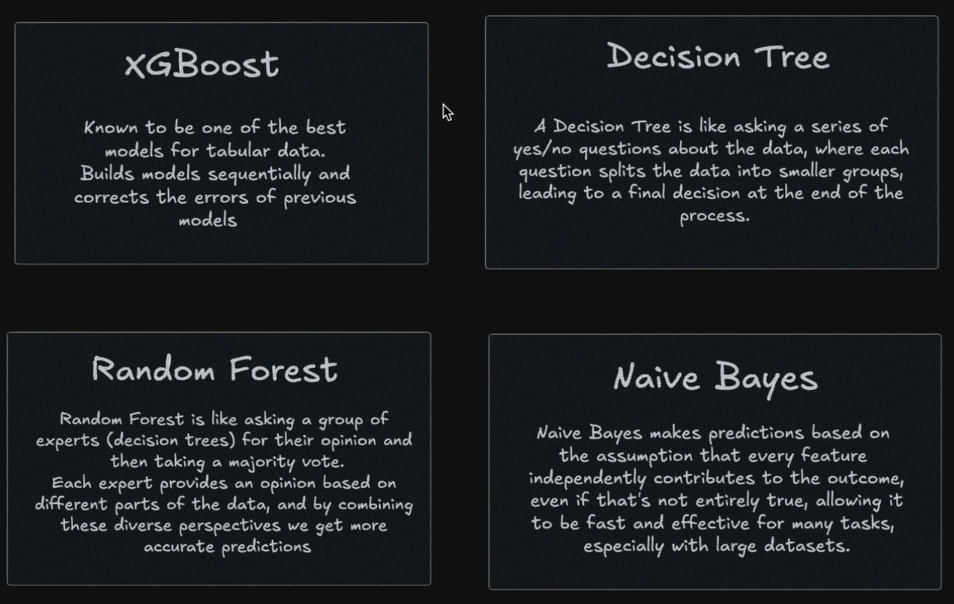

## Compare different model performance

In [40]:
import xgboost as xgb

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

from pickle import dump

In [112]:
divider = "---------------------\n"
def evaluate_and_save_model(model, X_train, X_test, y_train, y_test, suffix=""):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Print the accuracy rate of the model
    accuracy = accuracy_score(y_test, y_pred)
    modelName = model.__class__.__name__ 
    print(f"{modelName} Accuracy: {accuracy:.4f}")

    # Print classification report with zero_division=1 to avoid warnings
    report = classification_report(y_test, y_pred, zero_division=1)
    print(f"\nClassification Report:\n{report}")
    
    # Store the serialized model into file using pickle.dump
    filename = modelName + suffix + '.pkl'
    with open(filename, "wb") as file:
        dump(model, file)
        
    print(f"Model saved as {filename}")
    print(divider)

In [159]:
xgb_model = xgb.XGBClassifier(random_state=42)
evaluate_and_save_model(xgb_model, X_train, X_test, y_train, y_test)

rfc_model = RandomForestClassifier(random_state=42)
evaluate_and_save_model(rfc_model, X_train, X_test, y_train, y_test)

dtc_model = DecisionTreeClassifier(random_state=42)
evaluate_and_save_model(dtc_model, X_train, X_test, y_train, y_test)

svc_model = SVC(probability=True, class_weight='balanced')
evaluate_and_save_model(svc_model, X_train, X_test, y_train, y_test)

gnb_model = GaussianNB()
evaluate_and_save_model(gnb_model, X_train, X_test, y_train, y_test)

knc_model = KNeighborsClassifier()
evaluate_and_save_model(knc_model, X_train, X_test, y_train, y_test)
    

XGBClassifier Accuracy: 0.8540

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      1607
           1       0.67      0.50      0.58       393

    accuracy                           0.85      2000
   macro avg       0.78      0.72      0.74      2000
weighted avg       0.84      0.85      0.85      2000

Model saved as XGBClassifier.pkl
---------------------

RandomForestClassifier Accuracy: 0.8560

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      1607
           1       0.71      0.45      0.55       393

    accuracy                           0.86      2000
   macro avg       0.79      0.70      0.73      2000
weighted avg       0.84      0.86      0.84      2000

Model saved as RandomForestClassifier.pkl
---------------------

DecisionTreeClassifier Accuracy: 0.7815

Classification Report:
              precision    recall  f1-scor

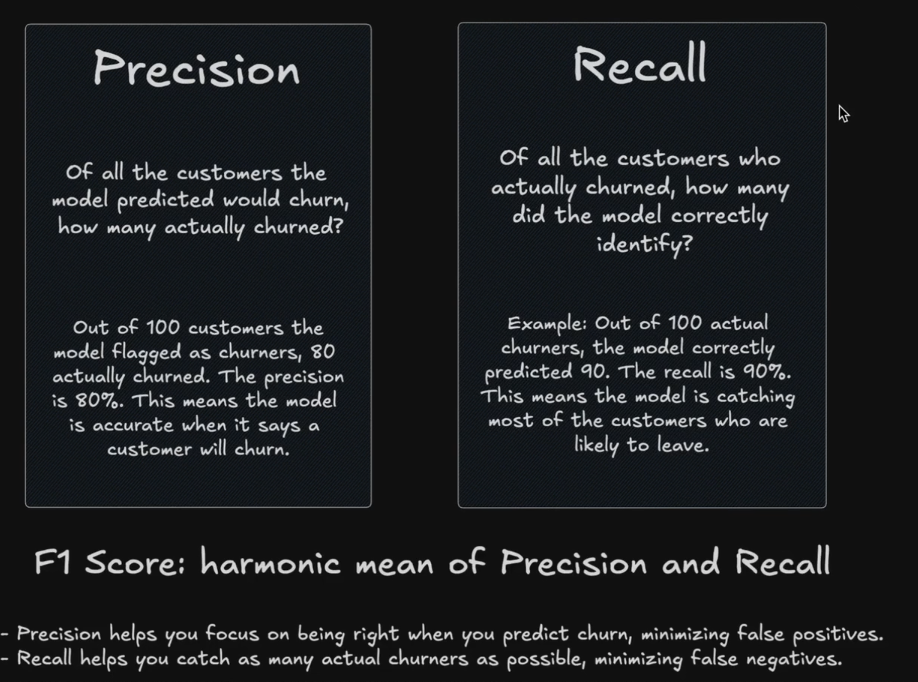

When we are evaluating the model's performance, oftentimes accruacy may not be the right measurement to use because the dataset is imbalanced. There around 8,000 customers who didn't churn and only 2000 who did. So in this case, the other metrics (precision, recall, f1-score) are better indicators.

PRECISION: is a ratio of true positive predictions to the toal number of positive predictions. It measures how many of the predicted churners are acually turners. Precision indicates the ratio of true positive to the total number of positive predictions. High precision means that our model predicts a customer will churn will indicate correctness.

RECALL: is a ratio of the true positive predictions to the toal number of actual churners. It measures how many of the acutal churners are correctly predicted by the model. In simple terms, out of all the customers who actually churn reall tells us what percentage of them are modeled correctly identifies. High recall means that our model is good at catching most of the customers who are going to churn.

F1-score: is the harmonic mean between precision and reall. This is useful when you have an uneven class distribution as it takes both false positives and false negatives into account. 

So precision helps you focus on being right when you predict churn, minimizing false positives. Recall helps you catch as many actual churners as possible minimizing false negatives.

Depending on the business context, we might want to prioritize maximizing precision or recall. For example, if it's expensive to offer discounts and other retention strategies to a lot of customers who end up not churning, we might prioritize precision and only offer discounts for customers who are very likely to churn. 

However, if a churn customer is very expensive to lose, we might prioritize maximizing recall to catch as many potential churners as possible. So this is because catching more churners, even if it means intervening with some customers who end up staying is better than losing money by not intervening with those who are going to churn.

In this case, the bank should priortize maximizing recall to catch as many potential churners as possible because acquiring a new customer is expensive.

In [135]:
feature_importances = xgb_model.feature_importances_
feature_importances

array([0.03500515, 0.10955006, 0.03005428, 0.05278618, 0.32388848,
       0.03194036, 0.16414645, 0.03265523, 0.04646329, 0.09137334,
       0.0368547 , 0.04528258, 0.        ], dtype=float32)

In [136]:
feature_names = encoded_features.columns
feature_names

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_France',
       'Geography_Germany', 'Geography_Spain', 'Gender_Female', 'Gender_Male'],
      dtype='object')

## Create a dataframe according to their importances

In [137]:
feature_importances_df = pd.DataFrame({
    'features': feature_names,
    'importance': feature_importances
})

feature_importances_df

,features,importance
0,CreditScore,0.035005
1,Age,0.109550
2,Tenure,0.030054
3,Balance,0.052786
4,NumOfProducts,0.323888
5,HasCrCard,0.031940
6,IsActiveMember,0.164146
7,EstimatedSalary,0.032655
8,Geography_France,0.046463
9,Geography_Germany,0.091373


In [138]:
feature_importances_df = feature_importances_df.sort_values(by='importance', ascending=False)
feature_importances_df

,features,importance
4,NumOfProducts,0.323888
6,IsActiveMember,0.164146
1,Age,0.109550
9,Geography_Germany,0.091373
3,Balance,0.052786
8,Geography_France,0.046463
11,Gender_Female,0.045283
10,Geography_Spain,0.036855
0,CreditScore,0.035005
7,EstimatedSalary,0.032655


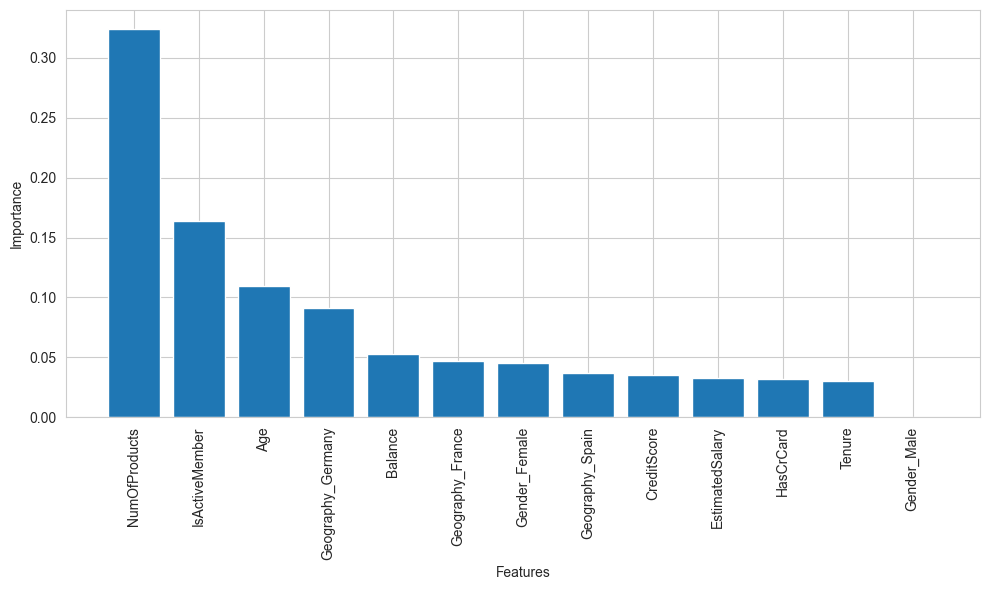

In [139]:
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['features'], feature_importances_df['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.tight_layout()
plt.show()


### Techniques to improve the performance of our Machine Learning models

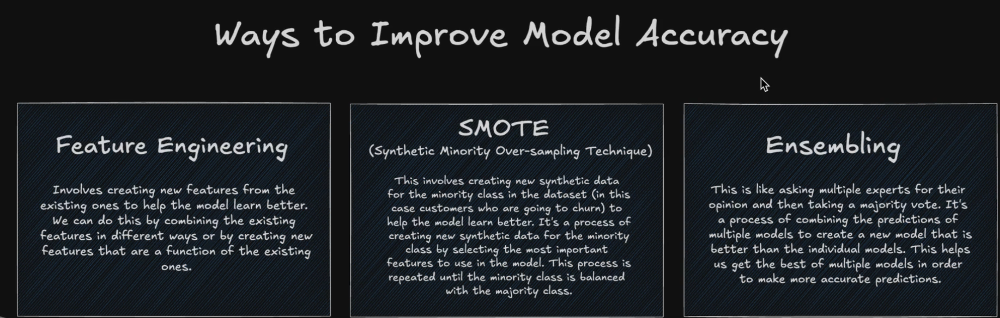

## Feature Engineering

Feature engineering creates new features that can improve our model's performance. We'll start by calculating a value known as the customer lifetime value and categorizing the customer's age into groups. This is a simplified approach to estimate the potential value a customer brings to a business over their lifetime.

1. Customer Lifetime Value
2. Age group
3. Customer's Loyalty

In [140]:
encoded_features['CLV'] = churn_df['Balance'] * churn_df['EstimatedSalary'] / 1000
encoded_features

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,CLV
0,619,42,2,0.00,1,1,1,101348.88,True,False,False,True,False,0.000000e+00
1,608,41,1,83807.86,1,0,1,112542.58,False,False,True,True,False,9.431953e+06
2,502,42,8,159660.80,3,1,0,113931.57,True,False,False,True,False,1.819041e+07
3,699,39,1,0.00,2,0,0,93826.63,True,False,False,True,False,0.000000e+00
4,850,43,2,125510.82,1,1,1,79084.10,False,False,True,True,False,9.925910e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,True,False,False,False,True,0.000000e+00
9996,516,35,10,57369.61,1,1,1,101699.77,True,False,False,False,True,5.834476e+06
9997,709,36,7,0.00,1,0,1,42085.58,True,False,False,True,False,0.000000e+00
9998,772,42,3,75075.31,2,1,0,92888.52,False,True,False,False,True,6.973634e+06


In [141]:
bins = [0, 30, 45, 60, 100]
labels = ['Young', 'MiddleAge', 'Senior', 'Elderly']


encoded_features['AgeGroup'] = pd.cut(churn_df['Age'], bins=bins, labels=labels)
encoded_features

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,CLV,AgeGroup
0,619,42,2,0.00,1,1,1,101348.88,True,False,False,True,False,0.000000e+00,MiddleAge
1,608,41,1,83807.86,1,0,1,112542.58,False,False,True,True,False,9.431953e+06,MiddleAge
2,502,42,8,159660.80,3,1,0,113931.57,True,False,False,True,False,1.819041e+07,MiddleAge
3,699,39,1,0.00,2,0,0,93826.63,True,False,False,True,False,0.000000e+00,MiddleAge
4,850,43,2,125510.82,1,1,1,79084.10,False,False,True,True,False,9.925910e+06,MiddleAge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,True,False,False,False,True,0.000000e+00,MiddleAge
9996,516,35,10,57369.61,1,1,1,101699.77,True,False,False,False,True,5.834476e+06,MiddleAge
9997,709,36,7,0.00,1,0,1,42085.58,True,False,False,True,False,0.000000e+00,MiddleAge
9998,772,42,3,75075.31,2,1,0,92888.52,False,True,False,False,True,6.973634e+06,MiddleAge


In [142]:
encoded_features['TenureAgeRatio'] = churn_df['Tenure'] / churn_df['Age']
encoded_features

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,CLV,AgeGroup,TenureAgeRatio
0,619,42,2,0.00,1,1,1,101348.88,True,False,False,True,False,0.000000e+00,MiddleAge,0.047619
1,608,41,1,83807.86,1,0,1,112542.58,False,False,True,True,False,9.431953e+06,MiddleAge,0.024390
2,502,42,8,159660.80,3,1,0,113931.57,True,False,False,True,False,1.819041e+07,MiddleAge,0.190476
3,699,39,1,0.00,2,0,0,93826.63,True,False,False,True,False,0.000000e+00,MiddleAge,0.025641
4,850,43,2,125510.82,1,1,1,79084.10,False,False,True,True,False,9.925910e+06,MiddleAge,0.046512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,True,False,False,False,True,0.000000e+00,MiddleAge,0.128205
9996,516,35,10,57369.61,1,1,1,101699.77,True,False,False,False,True,5.834476e+06,MiddleAge,0.285714
9997,709,36,7,0.00,1,0,1,42085.58,True,False,False,True,False,0.000000e+00,MiddleAge,0.194444
9998,772,42,3,75075.31,2,1,0,92888.52,False,True,False,False,True,6.973634e+06,MiddleAge,0.071429


In [143]:
encoded_features = pd.get_dummies(encoded_features, drop_first=True)
encoded_features

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,CLV,TenureAgeRatio,AgeGroup_MiddleAge,AgeGroup_Senior,AgeGroup_Elderly
0,619,42,2,0.00,1,1,1,101348.88,True,False,False,True,False,0.000000e+00,0.047619,True,False,False
1,608,41,1,83807.86,1,0,1,112542.58,False,False,True,True,False,9.431953e+06,0.024390,True,False,False
2,502,42,8,159660.80,3,1,0,113931.57,True,False,False,True,False,1.819041e+07,0.190476,True,False,False
3,699,39,1,0.00,2,0,0,93826.63,True,False,False,True,False,0.000000e+00,0.025641,True,False,False
4,850,43,2,125510.82,1,1,1,79084.10,False,False,True,True,False,9.925910e+06,0.046512,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,True,False,False,False,True,0.000000e+00,0.128205,True,False,False
9996,516,35,10,57369.61,1,1,1,101699.77,True,False,False,False,True,5.834476e+06,0.285714,True,False,False
9997,709,36,7,0.00,1,0,1,42085.58,True,False,False,True,False,0.000000e+00,0.194444,True,False,False
9998,772,42,3,75075.31,2,1,0,92888.52,False,True,False,False,True,6.973634e+06,0.071429,True,False,False


In [144]:
X_train, X_test, y_train, y_test = train_test_split(encoded_features, target, test_size=0.2, random_state=42)
print(X_train.size, X_test.size)

144000 36000


## Retrain models with the additional engineered features

In [164]:
xgb_model = xgb.XGBClassifier(random_state=42)
evaluate_and_save_model(xgb_model, X_train, X_test, y_train, y_test)

rfc_model = RandomForestClassifier(random_state=42)
evaluate_and_save_model(rfc_model, X_train, X_test, y_train, y_test)

dtc_model = DecisionTreeClassifier(random_state=42)
evaluate_and_save_model(dtc_model, X_train, X_test, y_train, y_test)

svc_model = SVC(probability=True, class_weight='balanced')
evaluate_and_save_model(svc_model, X_train, X_test, y_train, y_test)

gnb_model = GaussianNB()
evaluate_and_save_model(gnb_model, X_train, X_test, y_train, y_test)

knc_model = KNeighborsClassifier()
evaluate_and_save_model(knc_model, X_train, X_test, y_train, y_test)

XGBClassifier Accuracy: 0.8540

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      1607
           1       0.67      0.50      0.58       393

    accuracy                           0.85      2000
   macro avg       0.78      0.72      0.74      2000
weighted avg       0.84      0.85      0.85      2000

Model saved as XGBClassifier.pkl
---------------------

RandomForestClassifier Accuracy: 0.8560

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      1607
           1       0.71      0.45      0.55       393

    accuracy                           0.86      2000
   macro avg       0.79      0.70      0.73      2000
weighted avg       0.84      0.86      0.84      2000

Model saved as RandomForestClassifier.pkl
---------------------

DecisionTreeClassifier Accuracy: 0.7815

Classification Report:
              precision    recall  f1-scor

In [165]:
xgb_model = xgb.XGBClassifier(random_state=42)
evaluate_and_save_model(xgb_model, X_train, X_test, y_train, y_test, '-featureEngineer')

XGBClassifier Accuracy: 0.8540

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      1607
           1       0.67      0.50      0.58       393

    accuracy                           0.85      2000
   macro avg       0.78      0.72      0.74      2000
weighted avg       0.84      0.85      0.85      2000

Model saved as XGBClassifier-featureEngineer.pkl
---------------------



## Synthetic Minority Over-sampling Technique (SMOTE)

In [166]:
from imblearn.over_sampling import SMOTE

In [167]:
smote = SMOTE(random_state=42)

In [168]:
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [169]:
evaluate_and_save_model(xgb_model, X_resampled, X_test, y_resampled, y_test, '-SMOTE')

XGBClassifier Accuracy: 0.8595

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.93      0.91      1607
           1       0.67      0.56      0.61       393

    accuracy                           0.86      2000
   macro avg       0.78      0.75      0.76      2000
weighted avg       0.85      0.86      0.85      2000

Model saved as XGBClassifier-SMOTE.pkl
---------------------



## Ensemble

In [170]:
from sklearn.ensemble import VotingClassifier

In [171]:
voting_clf = VotingClassifier(
    estimators=[
        ('xgboost', xgb.XGBClassifier(random_state=42)), 
        ('rf', RandomForestClassifier(random_state=42)),
        ('dtc', DecisionTreeClassifier(random_state=42)),
        ('svm', SVC(random_state=42, probability=True)),
        ('gnb', GaussianNB()),
        ('knc', KNeighborsClassifier())
    ], voting = 'soft')
voting_clf

VotingClassifier(estimators=[('xgboost',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learnin...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...)),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('dtc', DecisionTreeClassifier(random_state=42)),
                             ('svm', SVC(probability=True, random_state=42)),
                             ('gnb', GaussianNB()),
                             ('knc', KNeighborsClassifier())],
                 voting='soft')

In [172]:
evaluate_and_save_model(voting_clf, X_resampled, X_test, y_resampled, y_test, '-voting')

VotingClassifier Accuracy: 0.8285

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.90      0.89      1607
           1       0.57      0.54      0.55       393

    accuracy                           0.83      2000
   macro avg       0.73      0.72      0.72      2000
weighted avg       0.83      0.83      0.83      2000

Model saved as VotingClassifier-voting.pkl
---------------------

